In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
import pathlib

PROJECT_ROOT = pathlib.Path().cwd().parent
sys.path.append(str(PROJECT_ROOT))

image_path = PROJECT_ROOT / 'ReMIND2Reg_dataset' / 'imagesTr'

from src.utils import *
from src.impedance import *
from src.datatype import MRIDataset, iUSDataset
from src.renderer import *

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import nibabel as nib
import torch
import torch.nn.functional as F
from sklearn.cluster import KMeans
from pathlib import Path

c:\Users\noe\anaconda3\envs\torchIO\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
patient_id = "005" # between 000 and 102, t1 and t2 don't exist for all patients
iUS_file = f"ReMIND2Reg_0{patient_id}_0000.nii.gz"
t1_file = f"ReMIND2Reg_0{patient_id}_0001.nii.gz"
t2_file = f"ReMIND2Reg_0{patient_id}_0002.nii.gz"
# dataset = MRIDataset([image_path / t1_file], "T1", axis=0)

In [4]:
dataset = MRIDataset([image_path / t1_file, image_path / t2_file], "T1", axis=0)
T1 = dataset[0]
T1_volume = T1["image"].squeeze(0)       # (D,H,W)
T2 = dataset[1]
T2_volume = T2["image"].squeeze(0)       # (D,H,W)

US = iUSDataset(image_path / iUS_file, "iUS", axis=0)

In [5]:
T1_data = pd.DataFrame(
    {"organ": ["fat","liver","muscle","BWM","BGM","CSF","AIR"],
     "intensity": [260,500,870,780,920,2500, 0], 
     "impedance": [1.34e6,1.67e6,1.68e6,1.6e6,1.6e6,1.5e6, 0.0004e6]}
)

# Train Impedance

In [6]:
T1_volume = T1_volume.float()
# T2_volume = T2_volume.float()

# t1 = np.array([-2.0, -1.0, 0.0,  1.5]).reshape(-1,1)
t1 = T1_data['intensity'].values.reshape(-1,1)
# t2 = np.array([-2.0, -0.5, 0.0,  2.0]).reshape(-1,1)
# z1 = np.array([400,  1.52e6, 1.7e6, 1.38e6]).reshape(-1,1)/1e6
z1 = T1_data['impedance'].values.reshape(-1,1)
# z2 = np.array([400,  1.38e6, 1.7e6, 1.52e6]).reshape(-1,1)/1e6

X1 = torch.tensor(t1, dtype=torch.float32)
Y1 = torch.tensor(z1, dtype=torch.float32)
# X2 = torch.tensor(t2, dtype=torch.float32)
# Y2 = torch.tensor(z2, dtype=torch.float32)

model_t1 = ImpedanceEstimator.train_model(X1, Y1, input_dim=1)
# model_t2 = ImpedanceEstimator.train_model(X2, Y2, input_dim=1)

Z_vol = ImpedanceEstimator.compute_impedance_volume(T1_volume, model_t1, threshold=50)
# Z_vol_2 = ImpedanceEstimator.compute_impedance_volume(T2_volume, model_t2, threshold=50)
# Z_vol = Z_vol_2 + Z_vol

In [47]:
def render(
    volume: torch.Tensor,
    source: torch.Tensor,
    directions: torch.Tensor,
    angle: float = 45.0,
    plot: bool = True,
    MRI : bool = False,
):
    """
    Simulates rays and plots the resulting ultrasound fan frame.
    
    Args:
        volume: (D, H, W) Tensor, ultrasound volume (acoustic impedance)
        source: (3,) Tensor, starting position of rays
        directions: (N_rays, 3) Tensor of ray directions (unit vectors)
        angle: fan angle (degrees), used for plotting geometry
    """
    # 1. Simulate reflection coefficients
    R = UR.simulate_rays(
        volume=volume,
        source=source,
        directions=directions,
        MRI=MRI,
    )

    # attenuation!
    attenuation_coeff = 0.0001
    depths = torch.arange(UR.num_samples, device=R.device).float()
    attenuation = torch.exp(-attenuation_coeff * depths)  # shape (num_samples,)
    if not MRI:
        processed_output = propagate_full_rays_batched(R)[:, ::2] * attenuation  # (N_rays, num_samples-1, 2*(num_samples-1))
    else:
        print("MRI Plot so less processing")
        processed_output = R
    if not plot:
        return processed_output

    processed_output_torch = processed_output.clone()        
    processed_output = processed_output.detach().cpu().numpy()

    # proceed only if requires plotting
    # 2. Convert to numpy
    n_rays, n_samples = processed_output.shape

    # 3. Compute ray geometry
    source_2d = np.array([128, 0])  # (x, z), assuming 2D fan centered at (128, 0)
    thetas = np.radians(np.linspace(-angle, angle, n_rays))  # shape (n_rays,)
    ray_len = n_samples  # number of points along each ray

    # Vectorized generation of all points
    steps = np.arange(ray_len)  # (n_samples,)

    directions_xz = np.stack([
        np.sin(thetas),   # (n_rays,)
        np.cos(thetas)    # (n_rays,)
    ], axis=1)  # (n_rays, 2)

    # Expand dimensions
    steps = steps[None, :, None]              # (1, n_samples, 1)
    directions_xz = directions_xz[:, None, :]  # (n_rays, 1, 2)

    points = source_2d[None, None, :] + steps * directions_xz  # (n_rays, n_samples, 2)

    x_coords = points[..., 0].flatten()
    z_coords = points[..., 1].flatten()
    intensities = processed_output.flatten()

    # 4. 
    return intensities, x_coords, z_coords

def plot_rendered(intensities, x_coords, z_coords):
    plt.figure(figsize=(6, 6))
    plt.rcParams['axes.facecolor'] = 'black'
    plt.scatter(x_coords, z_coords, c=intensities, cmap='gray', s=1)
    plt.gca().set_aspect('equal')
    plt.xlabel("X")
    plt.ylabel("Z")
    plt.title("Fan-shaped Ultrasound Frame")
    plt.colorbar(label="Intensity")
    plt.show()

# Render UltraSound

In [142]:
UR = UltrasoundRenderer(100, 0.00001)

In [143]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from scipy.ndimage import gaussian_filter1d

# ─── Fonctions d’artefacts ───────────────────────────────────────────────────

def radial_falloff_np(image: np.ndarray,
                      attenuation_min: float = 0.999,
                      power: float = 2.0) -> np.ndarray:
    """
    Applique un dégradé d'intensité selon la profondeur (axe samples).
    """
    n_rays, n_samples = image.shape
    # échelle de 1 à attenuation_min, puis puissance
    scale = np.linspace(1.0, attenuation_min, n_samples) ** power
    return image * scale[None, :]

def add_speckle_noise_np(image: np.ndarray,
                         std: float = 0.3) -> np.ndarray:
    """
    Ajoute du speckle noise multiplicatif (bruit gaussien autour de 1).
    """
    noise = np.random.normal(loc=1.0, scale=std, size=image.shape)
    noisy = image * noise
    vmin, vmax = image.min(), image.max()
    return np.clip(noisy, vmin, vmax)

def add_shadow_np(image: np.ndarray,
                  center_ray: int,
                  width: int = 5,
                  strength: float = 0.3) -> np.ndarray:
    """
    Simule une ombre acoustique en atténuant un faisceau (quelques rays).
    """
    shadowed = image.copy()
    start = max(center_ray - width, 0)
    end = min(center_ray + width + 1, image.shape[0])
    shadowed[start:end, :] *= strength
    return shadowed

def sharpen_np(image: np.ndarray,
               alpha: float = 1.5) -> np.ndarray:
    """
    Renforce le contraste local (unsharp masking).
    """
    blurred = gaussian_filter(image, sigma=1)
    sharp = image + alpha * (image - blurred)
    vmin, vmax = image.min(), image.max()
    return np.clip(sharp, vmin, vmax)

def add_speckle_arcs_np(image: np.ndarray,
                              std_radial: float = 0.1,
                              std_local: float = 0.02,
                              power_radial: float = 2.0,
                              power_local: float = 1.5) -> np.ndarray:
    """
    Speckle en arcs dont l'intensité de distorsion augmente avec la profondeur.
    
    - std_radial   : écart‑type de base du bruit radial (créant les arcs).
    - std_local    : écart‑type de base du grain local (texture fine).
    - power_radial : exponent pour renforcer le bruit radial selon la profondeur.
    - power_local  : exponent pour renforcer le grain local selon la profondeur.
    """
    n_rays, n_samples = image.shape
    # 1) Normalisation de la profondeur de 0 (près) à 1 (loin)
    depth_norm = np.linspace(0.0, 1.0, n_samples)

    # 2) STD radial et local variables selon depth_norm
    std_radial_z = std_radial * (1.0 + depth_norm**power_radial)   # arcs de plus en plus marqués
    std_local_z  = std_local  * (1.0 + depth_norm**power_local )   # grain de plus en plus grossier

    # 3) Bruit radial : un facteur par profondeur
    radial_noise = np.random.normal(loc=1.0,
                                    scale=std_radial_z,
                                    size=n_samples)

    # 4) Bruit local : un facteur par pixel (ray × profondeur)
    local_noise = np.random.normal(loc=1.0,
                                   scale=std_local_z[None, :],
                                   size=(n_rays, n_samples))

    # 5) Combinaison multiplicative
    noise = radial_noise[None, :] * local_noise

    # 6) Application et clipping des négatifs
    noised = image * noise
    noised[noised < 0] = 0.0

    return noised

def add_depth_dependent_lateral_blur_np(
    image: np.ndarray,
    max_sigma: float = 2.0
) -> np.ndarray:
    """
    Applique un flou gaussien le long de l'axe latéral (rays) 
    dont l'écart‑type augmente linéairement avec la profondeur.
    """
    n_rays, n_samples = image.shape
    blurred = image.copy()

    for z in range(n_samples):
        sigma = max_sigma * (z / (n_samples - 1)) if z > 0 else 1e-8
        # flou sur chaque colonne (constante en z)
        blurred[:, z] = gaussian_filter1d(blurred[:, z], sigma)

    return blurred

def add_depth_dependent_axial_blur_np(
    image: np.ndarray,
    max_kernel: int = 7
) -> np.ndarray:
    """
    Flou « axial » (sur la profondeur) qui grandit avec z, 
    en moyennant chaque point sur une fenêtre croissante.
    """
    n_rays, n_samples = image.shape
    blurred = image.copy()

    for z in range(n_samples):
        half = int((max_kernel * (z / (n_samples - 1))) // 2)
        if half < 1:
            continue

        start = max(0, z - half)
        end   = min(n_samples, z + half + 1)
        # moyenne la profondeur autour de z
        blurred[:, z] = np.mean(image[:, start:end], axis=1)

    return blurred



# ─── Fonctions principales ───────────────────────────────────────────────────

def rendere(
    volume: torch.Tensor,
    source: torch.Tensor,
    directions: torch.Tensor,
    angle: float = 45.0,
    plot: bool = True,
    MRI: bool = False,
    std_radial: float = 0.2,
    std_local: float = 0.05,
):
    """
    Simule les rayons, applique la pipeline US réaliste et renvoie
    intensities, x_coords, z_coords pour un plot scatter.
    """
    # 1. Simulation classique
    R = UR.simulate_rays(
        volume=volume,
        source=source,
        directions=directions,
        MRI=MRI,
    )

    # 2. Atténuation exponentielle linéaire
    attenuation_coeff = 0.0001
    depths = torch.arange(UR.num_samples, device=R.device).float()
    attenuation = torch.exp(-attenuation_coeff * depths)

    if not MRI:
        processed = propagate_full_rays_batched(R)[:, ::2] * attenuation
    else:
        processed = R

    if not plot:
        return processed

    # 3. Passage en numpy pour post‐traitements
    proc_np = processed.detach().cpu().numpy()  # shape (n_rays, n_samples)

    # ─── Pipeline de réalisme ────────────────────────
    # 3.1 Atténuation radiale
    # proc_np = radial_falloff_np(proc_np,
                                # attenuation_min=0.9999,
                                # power=2.0)
    # 3.2 Speckle noise
    # proc_np = add_speckle_noise_np(proc_np,
    #                                std=0.001)
    proc_np = add_speckle_arcs_np(proc_np, std_radial=std_radial, std_local=std_local)

    # 3.3 Ombre acoustique sur le faisceau central
    # center_ray = proc_np.shape[0] // 2
    # proc_np = add_shadow_np(proc_np,
    #                         center_ray=center_ray,
    #                         width=10,
    #                         strength=0.3)
    # 3.4 Renforcement de contraste local

    proc_np = add_depth_dependent_lateral_blur_np(proc_np,
    max_sigma=2.0)

    # proc_np = add_depth_dependent_axial_blur_np(proc_np,
    # max_kernel=7)

    proc_np = sharpen_np(proc_np, alpha=1.5)
    # ──────────────────────────────────────────────────

    # 4. Géométrie des rays pour le scatter plot
    n_rays, n_samples = proc_np.shape
    source_2d = np.array([128, 0])
    thetas = np.radians(np.linspace(-angle, angle, n_rays))
    steps = np.arange(n_samples)

    dirs_xz = np.stack([np.sin(thetas), np.cos(thetas)], axis=1)
    steps = steps[None, :, None]                 # (1, n_samples, 1)
    dirs_xz = dirs_xz[:, None, :]                # (n_rays, 1, 2)
    points = source_2d[None, None, :] + steps * dirs_xz

    x_coords = points[..., 0].ravel()
    z_coords = points[..., 1].ravel()
    intensities = proc_np.ravel()

    return intensities, x_coords, z_coords

def plot_rendered(intensities, x_coords, z_coords):
    plt.figure(figsize=(6, 6))
    plt.rcParams['axes.facecolor'] = 'black'
    plt.scatter(x_coords, z_coords,
                c=intensities,
                cmap='gray',
                s=1,
                marker='s')
    plt.gca().set_aspect('equal')
    plt.xlabel("X")
    plt.ylabel("Z")
    plt.title("Ultrasound Rendered with Realistic Texture")
    plt.colorbar(label="Intensity")
    plt.show()





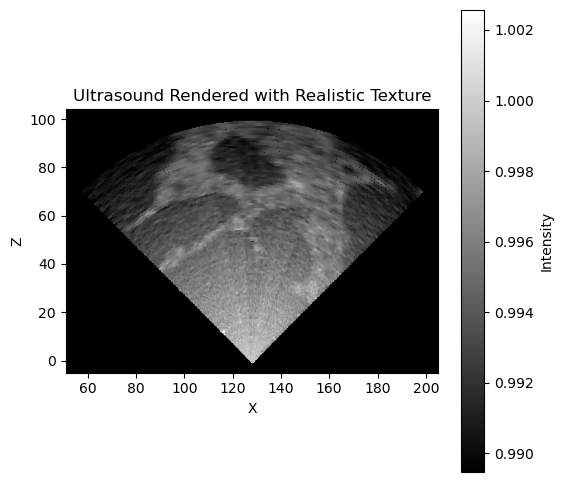

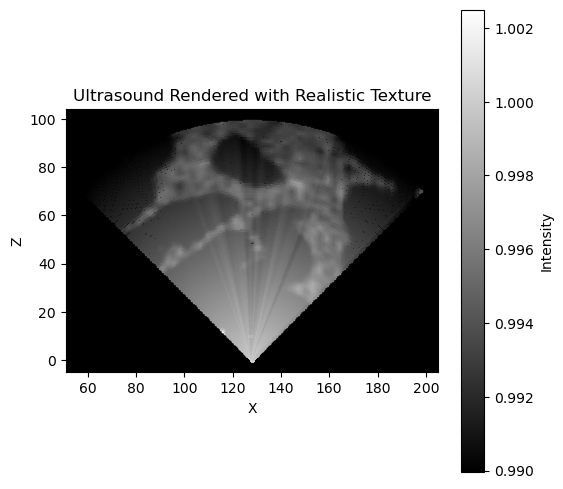

In [144]:
angle = 30  
rays = 200

thetas = np.radians(np.linspace(-angle, angle, rays))
dirs = [np.array([np.sin(t), np.cos(t), 0]) for t in thetas]

source = torch.tensor([150, 0., 40])

intensities, x_coords, z_coords = rendere(
    volume=Z_vol,
    source=source,
    directions=torch.tensor(dirs),
    plot=True ,
    std_radial=0.00005,
    std_local=0.0003

)

plot_rendered(intensities, x_coords, z_coords)

intensities, x_coords, z_coords = render(
    volume=Z_vol,
    source=source,
    directions=torch.tensor(dirs),
    plot=True
)

plot_rendered(intensities, x_coords, z_coords)

In [22]:
UR = UltrasoundRenderer(200, 0.0001)

angle = 20  # degrees
rays = 200

thetas = np.radians(np.linspace(-angle,angle, rays))  # 64 rays across the fan
directions = [np.array([np.sin(theta), np.cos(theta), 0]) for theta in thetas]

In [24]:
intensities, x_coords, z_coords = render(volume=Z_vol,
    source=torch.tensor([100,0.,40]),
    directions=torch.tensor(directions),
    angle=45
)

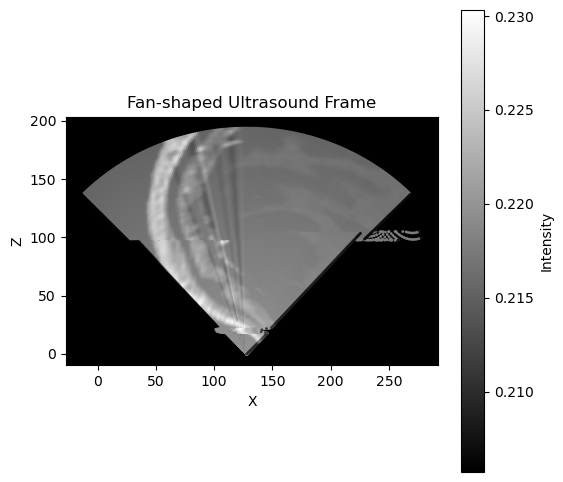

In [27]:
# 1) render your raw fan
intensities, x_coords, z_coords = render(
    volume=Z_vol,
    source=torch.tensor([100,0.,40]),
    directions=torch.tensor(directions),
    angle=45
)

# 2) compute dims
n_rays    = rays                  # e.g. 200
n_samples = intensities.size // n_rays

# 3) optional speed_profile definition
#    here a three‐layer skin→fat→muscle
speed_profile = np.concatenate([
    np.full(20, 1540.0),
    np.full(80, 1450.0),
    np.full(n_samples-100, 1580.0)
])

# 4) geometric warps
x_coords, z_coords = barrel_distortion(x_coords, z_coords, k=1e-6)
x_coords, z_coords = refraction_distortion(x_coords, z_coords, speed_profile, spacing=1.0, max_shear=0.5)
z_coords          = speed_of_sound_distortion(z_coords, speed_profile, spacing=1.0, c0=1540.0)

# 5) acoustic artifacts
intensities = apply_side_lobe_artifacts_flat(intensities, n_rays, n_samples, frac=0.05)
intensities = apply_shadow_flat(intensities,   n_rays, n_samples, thresh=0.7, shadow_atten=0.2)

# 6) finally plot
plot_rendered(intensities, x_coords, z_coords)


In [14]:
raw = UR.simulate_rays(volume=Z_vol, source=torch.tensor([100,0.,40]), directions=torch.tensor(directions))         # (n_rays, n_depth)
bmode = UR.frame_to_bmode(raw)                             # log‑compressed [0,1]

In [15]:
bmode = add_side_lobe_artifacts(bmode, frac=0.05)
bmode = add_shadow(bmode, thresh=0.7, shadow_atten=0.2)

In [18]:
# original scatter
thetas = np.radians(np.linspace(-angle, angle, bmode.shape[0]))
depths = np.arange(bmode.shape[1])
x0 = np.outer(np.sin(thetas), depths)
z0 = np.outer(np.cos(thetas), depths)

n_depth = bmode.shape[1]
speed_profile = np.full(n_depth, 1540.0) 

# barrel + refraction + speed‑of‑sound
x1, z1 = apply_barrel_distortion(x0.ravel(), z0.ravel(), k=1e-6)
x2, _ = apply_refraction(x1, z1, speed_profile, spacing=1.0)
z2 = apply_speed_of_sound_distortion(z1, speed_profile, spacing=1.0)

bmode = add_side_lobe_artifacts(bmode, frac=0.05)
bmode = add_shadow(bmode, thresh=0.7, shadow_atten=0.2)


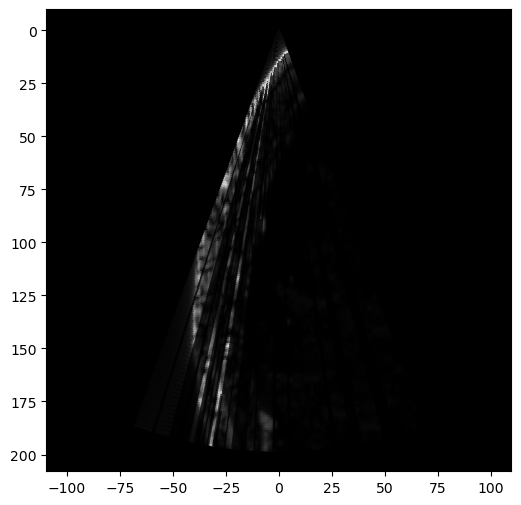

In [19]:
plt.figure(figsize=(6,6))
plt.scatter(x2, z2, c=bmode.ravel(), cmap='gray', s=1)
plt.gca().invert_yaxis()
plt.axis('equal')
plt.show()


C:\Users\g630d\AppData\Local\Temp\ipykernel_27068\605946546.py:4: UserWarning:

Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\cb\pytorch_1000000000000\work\torch\csrc\utils\tensor_new.cpp:281.)



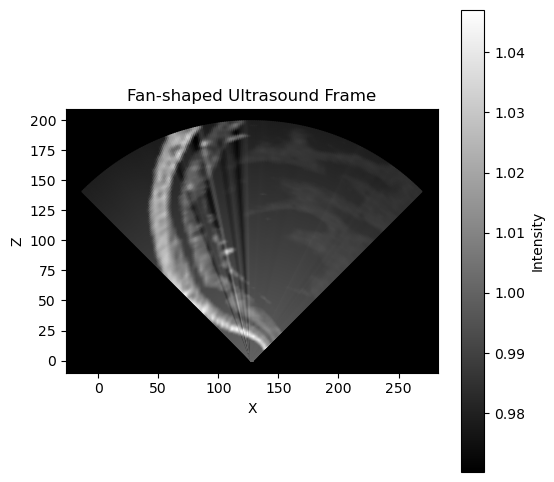

In [11]:
output = UR.plot_beam_frame(
    volume=Z_vol,
    source=torch.tensor([100,0.,40]),
    directions=torch.tensor(directions),
    angle=45
)


In [38]:
T1_volume.size()

torch.Size([276, 198, 8])

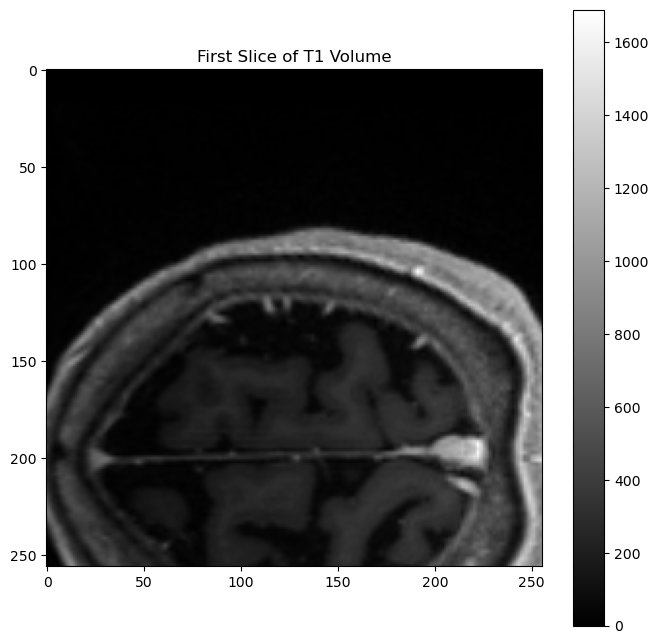

In [58]:
plt.figure(figsize=(8, 8))  # Optional: Adjust the figure size
plt.imshow(T1_volume[:, :, 3], cmap='gray')  # Use grayscale colormap
plt.title("First Slice of T1 Volume")  # Add a title
plt.colorbar()  # Add a colorbar for intensity reference
plt.show()

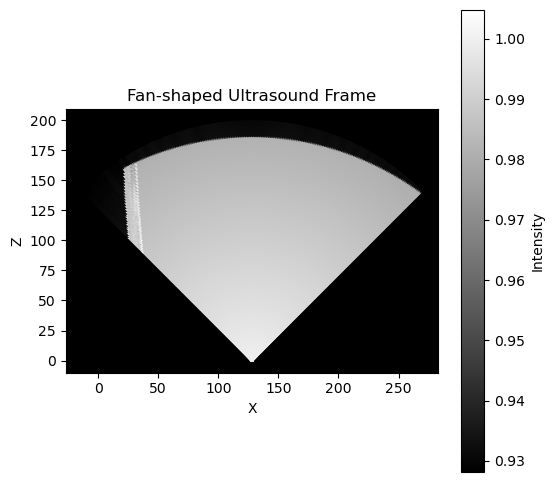

In [52]:
output = UR.plot_beam_frame(
    volume=T1_volume,
    source=torch.tensor([50,0.,3]),
    directions=torch.tensor(directions),
    angle=45
)


# Videos

In [9]:
%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib import animation
from IPython.display import HTML


In [10]:
def render_video(source, axis):
    fig = plt.figure()

    # Initial frame
    slicer = [slice(None)] * 3
    slicer[axis] = 0
    frame0 = source[tuple(slicer)]
    
    im = plt.imshow(frame0, cmap='gray', animated=True, vmin=0, vmax=source.max())

    def init():
        im.set_data(frame0)
        return [im]

    def animate(i):
        slicer[axis] = i
        im.set_data(source[tuple(slicer)])
        plt.title(f"Frame {i}")
        return [im]
    
    plt.close(fig)
    
    return animation.FuncAnimation(
        fig, animate, init_func=init, frames=source.shape[axis], interval=50, blit=True
    )


In [11]:
VIDEO = US.data.numpy()

In [12]:
from matplotlib.colors import ListedColormap


extract = VIDEO[100,:,:]
gray_cmap = plt.cm.gray(np.linspace(0, 1, 256))
gray_cmap[0] = [1.0, 0.4, 0.7, 1.0]  # RGBA for pink
custom_cmap = ListedColormap(gray_cmap)

# Normalize so 0 stays 0, rest maps to [1, 255]
norm = plt.Normalize(vmin=0, vmax=extract.max())

# Plot
plt.imshow(extract, cmap=custom_cmap, norm=norm)


In [13]:
anim = render_video(source=VIDEO, axis=0)
HTML(anim.to_jshtml())